In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 21.0 MB/s eta 0:00:0000:01


In [3]:
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np  
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')


image = cv2.imread("/kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/train/images/10_jpg.rf.44251e9bfd3a03a724b19fbabff8b658.jpg")
h, w, c = image.shape
print(f"The image has dimensions {w}x{h} and {c} channels.")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
The image has dimensions 256x256 and 3 channels.


In [8]:
import os
import shutil
import random
import yaml  # Import YAML module

# Define paths (Original dataset is read-only)
input_path = "/kaggle/input/underwater-trash-detection/utd2.v8i.yolov8"
working_path = "/kaggle/working/dataset"

# Copy dataset to working directory
if not os.path.exists(working_path):
    shutil.copytree(input_path, working_path)

# Define new paths in working directory
dataset_path = working_path
all_images_path = os.path.join(dataset_path, "all_images")
all_labels_path = os.path.join(dataset_path, "all_labels")

# Create a single folder for all images & labels
os.makedirs(all_images_path, exist_ok=True)
os.makedirs(all_labels_path, exist_ok=True)

# Function to move files
def move_files(src_folder, dest_folder, extensions=("jpg", "png", "jpeg", "txt")):
    if os.path.exists(src_folder):
        for file in os.listdir(src_folder):
            if file.endswith(extensions):
                shutil.move(os.path.join(src_folder, file), os.path.join(dest_folder, file))

# Merge train, test, and valid into one folder
move_files(os.path.join(dataset_path, "train", "images"), all_images_path)
move_files(os.path.join(dataset_path, "train", "labels"), all_labels_path, extensions=("txt",))
move_files(os.path.join(dataset_path, "test", "images"), all_images_path)
move_files(os.path.join(dataset_path, "test", "labels"), all_labels_path, extensions=("txt",))
move_files(os.path.join(dataset_path, "valid", "images"), all_images_path)
move_files(os.path.join(dataset_path, "valid", "labels"), all_labels_path, extensions=("txt",))

# Get shuffled list of images
all_images = sorted(os.listdir(all_images_path))
random.shuffle(all_images)

# Calculate new split sizes
total_images = len(all_images)
train_size = int(0.7 * total_images)
test_size = total_images - train_size  # Remaining 30%

# Create new train & test folders
train_images_path = os.path.join(dataset_path, "train", "images")
train_labels_path = os.path.join(dataset_path, "train", "labels")
test_images_path = os.path.join(dataset_path, "test", "images")
test_labels_path = os.path.join(dataset_path, "test", "labels")

os.makedirs(train_images_path, exist_ok=True)
os.makedirs(train_labels_path, exist_ok=True)
os.makedirs(test_images_path, exist_ok=True)
os.makedirs(test_labels_path, exist_ok=True)

# Move files to new train & test folders
for i, img_file in enumerate(all_images):
    img_path = os.path.join(all_images_path, img_file)
    label_file = img_file.rsplit('.', 1)[0] + ".txt"  # Ensure correct label filename
    label_path = os.path.join(all_labels_path, label_file)

    if i < train_size:
        shutil.move(img_path, os.path.join(train_images_path, img_file))
        if os.path.exists(label_path):
            shutil.move(label_path, os.path.join(train_labels_path, label_file))
    else:
        shutil.move(img_path, os.path.join(test_images_path, img_file))
        if os.path.exists(label_path):
            shutil.move(label_path, os.path.join(test_labels_path, label_file))

# Remove temp folders
shutil.rmtree(all_images_path)
shutil.rmtree(all_labels_path)

print(f"✅ Dataset successfully re-split into {train_size} training images and {test_size} test images!")

# Update data.yaml (Set val path to test)
yaml_path = os.path.join(dataset_path, "data.yaml")

if os.path.exists(yaml_path):
    with open(yaml_path, "r") as f:
        data = yaml.safe_load(f)

    # Modify train and test paths
    data["train"] = os.path.join(dataset_path, "train")
    data["test"] = os.path.join(dataset_path, "test")

    # Set val = test to prevent errors
    data["val"] = data["test"]

    # Save updated YAML file
    with open(yaml_path, "w") as f:
        yaml.dump(data, f, default_flow_style=False)

    print(f"📄 Updated data.yaml: \n - train: {data['train']} \n - test: {data['test']}")
else:
    print("🚨 data.yaml not found! Skipping update.")


✅ Dataset successfully re-split into 6703 training images and 2873 test images!
📄 Updated data.yaml: 
 - train: /kaggle/working/dataset/train 
 - test: /kaggle/working/dataset/test



image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/train/images/10_jpg.rf.44251e9bfd3a03a724b19fbabff8b658.jpg: 640x640 (no detections), 10.1ms
Speed: 2.4ms preprocess, 10.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


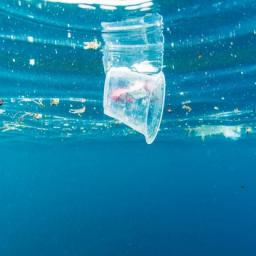

In [9]:
model = YOLO("yolov5nu.pt") 

# Use the model to detect object
image = "/kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/train/images/10_jpg.rf.44251e9bfd3a03a724b19fbabff8b658.jpg"
result_predict = model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

In [10]:
# Build from YAML and transfer weights
Final_model = YOLO('yolov5nu.yaml').load('yolov5nu.pt')  

# Training The Final Model
Result_Final_model = Final_model.train(data="/kaggle/working/dataset/data.yaml",epochs=50, imgsz = 640, batch = 4 ,lr0=0.01, dropout= 0.15, device = 0)

Transferred 427/427 items from pretrained weights
Ultralytics 8.3.96 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov5nu.yaml, data=/kaggle/working/dataset/data.yaml, epochs=50, time=None, patience=100, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train2, exist_ok=False, pretrained=yolov5nu.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.15, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=Fal

train: Scanning /kaggle/working/dataset/train/labels... 6703 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6703/6703 [00:06<00:00, 1101.50it/s]

train: WARNING ⚠️ /kaggle/working/dataset/train/images/obj1218_frame0000050_jpg.rf.4cc583ce533567da933951eafb1a3604.jpg: 1 duplicate labels removed


train: New cache created: /kaggle/working/dataset/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/dataset/test/labels... 2873 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2873/2873 [00:02<00:00, 1188.53it/s]


val: New cache created: /kaggle/working/dataset/test/labels.cache
Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50     0.625G      1.576       2.73      1.712          5        640: 100%|██████████| 1676/1676 [02:16<00:00, 12.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:22<00:00, 16.21it/s]


                   all       2873       4184      0.398      0.381      0.316      0.154

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50     0.746G      1.646       2.35      1.768         10        640: 100%|██████████| 1676/1676 [02:11<00:00, 12.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.25it/s]


                   all       2873       4184      0.414      0.359      0.324      0.162

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50     0.746G      1.647      2.254      1.761          5        640: 100%|██████████| 1676/1676 [02:10<00:00, 12.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.36it/s]


                   all       2873       4184       0.47      0.403      0.379      0.191

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50     0.746G      1.638      2.238      1.767         10        640: 100%|██████████| 1676/1676 [02:08<00:00, 12.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.34it/s]


                   all       2873       4184      0.446      0.388      0.368      0.182

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50     0.746G       1.59      2.128       1.73          8        640: 100%|██████████| 1676/1676 [02:09<00:00, 12.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.30it/s]


                   all       2873       4184      0.445      0.426      0.412      0.217

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50     0.746G      1.563      2.025      1.704         13        640: 100%|██████████| 1676/1676 [02:09<00:00, 12.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.48it/s]


                   all       2873       4184      0.485      0.471      0.492      0.257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50     0.746G      1.524      1.962       1.68          5        640: 100%|██████████| 1676/1676 [02:09<00:00, 12.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.34it/s]


                   all       2873       4184      0.609      0.459      0.489      0.273

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50     0.746G        1.5      1.917      1.656         10        640: 100%|██████████| 1676/1676 [02:08<00:00, 13.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.35it/s]


                   all       2873       4184      0.597      0.523      0.556       0.32

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50     0.746G      1.476      1.826      1.638          7        640: 100%|██████████| 1676/1676 [02:09<00:00, 12.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.62it/s]


                   all       2873       4184      0.583      0.549      0.599      0.343

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50     0.746G      1.459      1.782      1.627         19        640: 100%|██████████| 1676/1676 [02:10<00:00, 12.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.19it/s]


                   all       2873       4184      0.596      0.547      0.583      0.335

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50     0.746G      1.437      1.744      1.609          5        640: 100%|██████████| 1676/1676 [02:10<00:00, 12.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.24it/s]


                   all       2873       4184      0.698      0.589      0.645      0.385

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50     0.746G      1.426       1.72      1.607          8        640: 100%|██████████| 1676/1676 [02:08<00:00, 13.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.44it/s]


                   all       2873       4184      0.702      0.581      0.653      0.391

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50     0.746G      1.418      1.655      1.587          4        640: 100%|██████████| 1676/1676 [02:09<00:00, 12.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.20it/s]


                   all       2873       4184      0.713        0.6      0.667      0.401

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50     0.746G      1.402      1.626      1.579          5        640: 100%|██████████| 1676/1676 [02:09<00:00, 12.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.19it/s]


                   all       2873       4184      0.699      0.621      0.689      0.418

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50     0.746G      1.382      1.596      1.561         15        640: 100%|██████████| 1676/1676 [02:09<00:00, 12.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.39it/s]


                   all       2873       4184       0.73      0.647       0.72      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50     0.746G      1.381      1.575      1.565          8        640: 100%|██████████| 1676/1676 [02:09<00:00, 12.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.62it/s]

                   all       2873       4184      0.719      0.656      0.708      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50     0.746G      1.359      1.534      1.544          8        640: 100%|██████████| 1676/1676 [02:09<00:00, 12.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.46it/s]

                   all       2873       4184      0.728      0.677      0.731      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50     0.746G      1.361      1.495      1.553          5        640: 100%|██████████| 1676/1676 [02:08<00:00, 13.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.36it/s]

                   all       2873       4184      0.739      0.676      0.742      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50     0.746G      1.339      1.479      1.528         11        640: 100%|██████████| 1676/1676 [02:09<00:00, 12.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.40it/s]

                   all       2873       4184      0.781      0.642       0.75      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50     0.746G      1.343      1.463      1.532          9        640: 100%|██████████| 1676/1676 [02:09<00:00, 12.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.53it/s]


                   all       2873       4184      0.779      0.689      0.767      0.492

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50     0.746G      1.316      1.443      1.523          4        640: 100%|██████████| 1676/1676 [02:09<00:00, 12.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.41it/s]

                   all       2873       4184      0.775      0.673      0.759      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50     0.746G      1.307      1.411      1.508         13        640: 100%|██████████| 1676/1676 [02:09<00:00, 12.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.53it/s]


                   all       2873       4184      0.768      0.702      0.765      0.495

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50     0.746G       1.31      1.396      1.508          7        640: 100%|██████████| 1676/1676 [02:09<00:00, 12.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.33it/s]


                   all       2873       4184      0.799      0.685      0.779      0.501

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50     0.746G      1.299      1.374      1.495          8        640: 100%|██████████| 1676/1676 [02:09<00:00, 12.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.30it/s]


                   all       2873       4184        0.8      0.711      0.795       0.52

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50     0.746G      1.286      1.342      1.488          7        640: 100%|██████████| 1676/1676 [02:11<00:00, 12.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.32it/s]


                   all       2873       4184      0.796      0.736       0.81      0.533

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50     0.746G      1.287      1.331      1.484          7        640: 100%|██████████| 1676/1676 [02:08<00:00, 13.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.53it/s]

                   all       2873       4184      0.801      0.726      0.801      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50     0.746G      1.283      1.323      1.483         11        640: 100%|██████████| 1676/1676 [02:07<00:00, 13.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.61it/s]


                   all       2873       4184      0.805      0.729      0.811      0.534

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50     0.746G      1.262      1.275      1.468          2        640: 100%|██████████| 1676/1676 [02:07<00:00, 13.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.35it/s]

                   all       2873       4184      0.828      0.728      0.814       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50     0.746G      1.263      1.266      1.466         12        640: 100%|██████████| 1676/1676 [02:08<00:00, 13.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.65it/s]


                   all       2873       4184      0.838      0.736       0.83      0.556

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50     0.746G      1.246      1.242      1.449          4        640: 100%|██████████| 1676/1676 [02:08<00:00, 13.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.53it/s]

                   all       2873       4184      0.826      0.743       0.83      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50     0.746G      1.243      1.231      1.452          6        640: 100%|██████████| 1676/1676 [02:07<00:00, 13.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.63it/s]


                   all       2873       4184       0.84      0.746      0.836      0.564

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50     0.746G      1.251      1.222      1.453          4        640: 100%|██████████| 1676/1676 [02:07<00:00, 13.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.73it/s]


                   all       2873       4184      0.811       0.75      0.828      0.561

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50     0.746G      1.233      1.212      1.448          9        640: 100%|██████████| 1676/1676 [02:07<00:00, 13.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.65it/s]


                   all       2873       4184       0.84      0.749      0.838      0.564

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50     0.746G      1.235      1.196      1.437         12        640: 100%|██████████| 1676/1676 [02:07<00:00, 13.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:19<00:00, 18.18it/s]

                   all       2873       4184      0.816      0.774      0.841      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50     0.746G      1.215      1.164      1.423         10        640: 100%|██████████| 1676/1676 [02:07<00:00, 13.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.69it/s]


                   all       2873       4184      0.824      0.778      0.846      0.579

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50     0.746G      1.205      1.177      1.424         11        640: 100%|██████████| 1676/1676 [02:08<00:00, 13.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.49it/s]


                   all       2873       4184      0.845      0.759      0.847       0.58

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50     0.746G      1.208      1.158      1.427          5        640: 100%|██████████| 1676/1676 [02:08<00:00, 13.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.71it/s]


                   all       2873       4184      0.844      0.781      0.852      0.585

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50     0.746G      1.194      1.108      1.412          9        640: 100%|██████████| 1676/1676 [02:08<00:00, 13.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.21it/s]


                   all       2873       4184      0.838      0.784      0.849      0.585

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50     0.746G      1.193      1.115      1.414          9        640: 100%|██████████| 1676/1676 [02:08<00:00, 12.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.58it/s]


                   all       2873       4184      0.857      0.768      0.859       0.59

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50     0.746G      1.173      1.091      1.399          7        640: 100%|██████████| 1676/1676 [02:08<00:00, 13.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.55it/s]

                   all       2873       4184      0.844      0.773      0.857      0.596


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50     0.746G      1.166     0.9087      1.417          3        640: 100%|██████████| 1676/1676 [02:07<00:00, 13.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.47it/s]


                   all       2873       4184      0.855      0.777      0.861      0.603

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50     0.746G       1.14     0.8742      1.402          3        640: 100%|██████████| 1676/1676 [02:07<00:00, 13.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:21<00:00, 17.11it/s]


                   all       2873       4184      0.858      0.767      0.863      0.606

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50     0.746G      1.138     0.8655      1.401          4        640: 100%|██████████| 1676/1676 [02:06<00:00, 13.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.45it/s]

                   all       2873       4184      0.872      0.769      0.868      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50     0.746G      1.116     0.8331      1.382          7        640: 100%|██████████| 1676/1676 [02:06<00:00, 13.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.41it/s]


                   all       2873       4184      0.851      0.789       0.87      0.615

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50     0.746G      1.109     0.8208      1.378          3        640: 100%|██████████| 1676/1676 [02:08<00:00, 13.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.42it/s]

                   all       2873       4184      0.844      0.796      0.871      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50     0.746G      1.093     0.7922      1.362          4        640: 100%|██████████| 1676/1676 [02:07<00:00, 13.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.37it/s]


                   all       2873       4184      0.874      0.781      0.875      0.622

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50     0.746G      1.097      0.795      1.362          6        640: 100%|██████████| 1676/1676 [02:07<00:00, 13.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.57it/s]


                   all       2873       4184       0.87      0.793      0.878      0.629

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50     0.746G       1.08      0.779      1.352          5        640: 100%|██████████| 1676/1676 [02:07<00:00, 13.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.42it/s]


                   all       2873       4184      0.854      0.801      0.877      0.629

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50     0.746G      1.068     0.7589      1.346          3        640: 100%|██████████| 1676/1676 [02:05<00:00, 13.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.64it/s]

                   all       2873       4184      0.861      0.799      0.879      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50     0.746G      1.061     0.7537      1.338          3        640: 100%|██████████| 1676/1676 [02:05<00:00, 13.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:20<00:00, 17.60it/s]

                   all       2873       4184      0.863      0.802      0.881      0.632



50 epochs completed in 2.082 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.3MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.3MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.96 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 360/360 [00:18<00:00, 19.50it/s]


                   all       2873       4184       0.86      0.805      0.881      0.632
                   Bio        638        848      0.847      0.786      0.864      0.627
                   Rov        444        572       0.82      0.827      0.881      0.687
                 Trash       2267       2764      0.912      0.802      0.898      0.582
Speed: 0.2ms preprocess, 1.9ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/train2


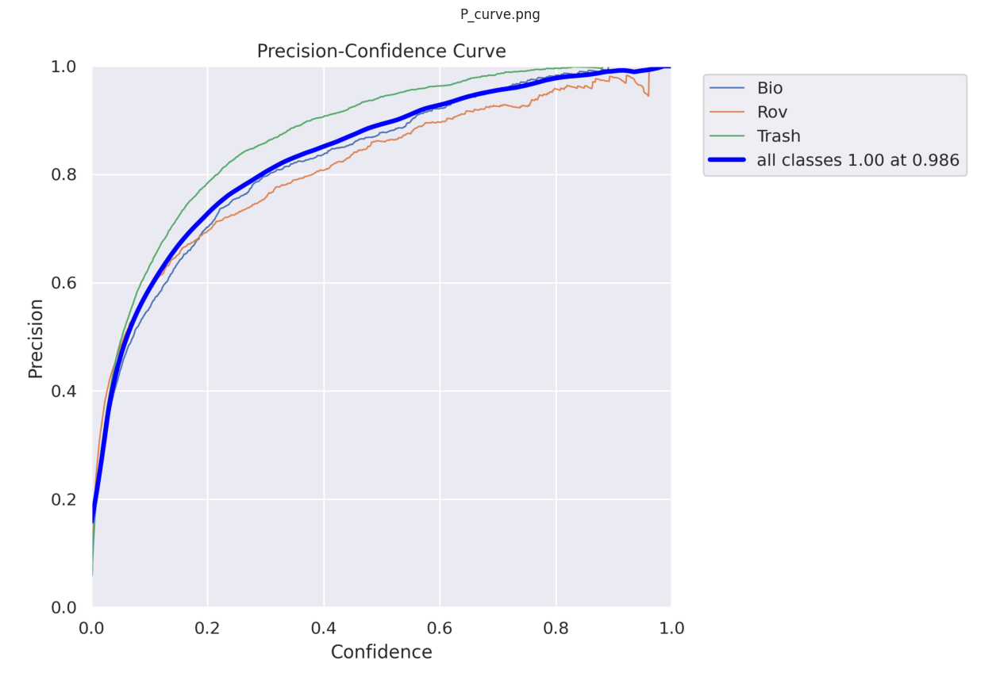

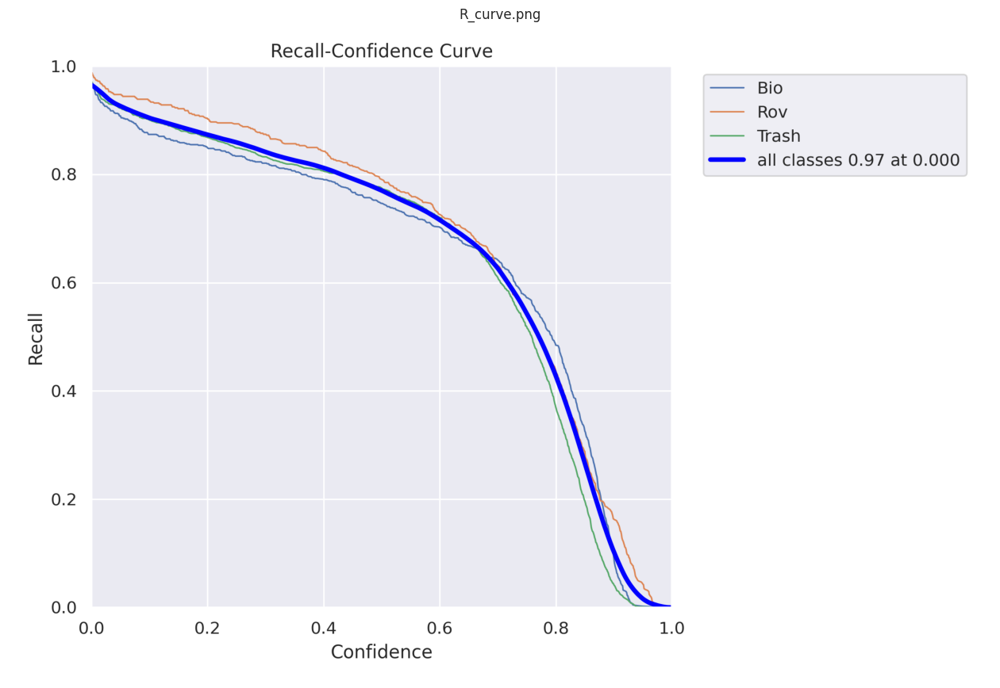

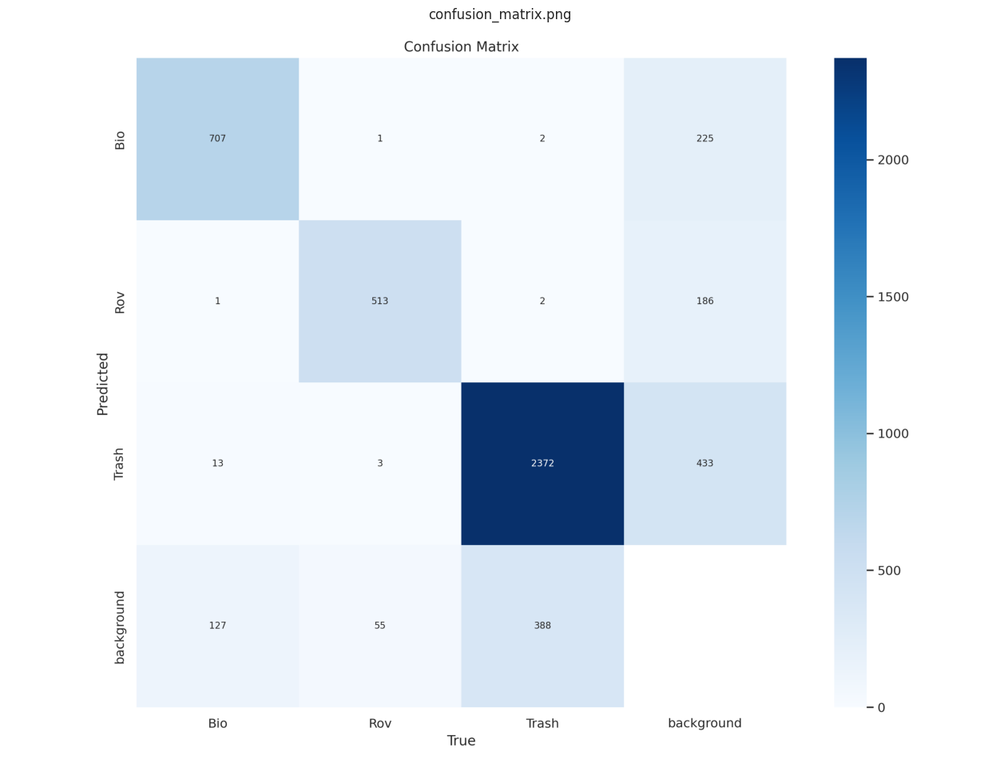

In [14]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

list_of_metrics = ["P_curve.png", "R_curve.png", "confusion_matrix.png"]

for i in list_of_metrics:
    img_path = f"/kaggle/working/runs/detect/train2/{i}"
    
    # Read the image
    img = cv2.imread(img_path)

    if img is not None:
        # Convert BGR to RGB (for proper visualization)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Display the image
        plt.figure(figsize=(16, 12))
        plt.imshow(img)
        plt.axis("off")  # Hide axes
        plt.title(i)  # Set title
        plt.show()
    else:
        print(f"⚠️ Error: {i} not found at {img_path}")


In [15]:
results = pd.read_csv("/kaggle/working/runs/detect/train2/results.csv")
results.head()

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,163.003,1.57584,2.72969,1.71188,0.39816,0.38067,0.31561,0.15357,1.68394,2.16151,1.86243,0.000476,0.000476,0.000476
1,2,315.816,1.64612,2.34977,1.76799,0.41449,0.35911,0.32413,0.16152,1.72140,2.14594,1.87251,0.000934,0.000934,0.000934
2,3,467.521,1.64703,2.25382,1.76124,0.47047,0.40319,0.37911,0.19149,1.70352,1.93509,1.89244,0.001372,0.001372,0.001372
3,4,617.754,1.63757,2.23758,1.76715,0.44645,0.38786,0.36816,0.18234,1.73812,1.96625,1.90595,0.001344,0.001344,0.001344
4,5,768.409,1.58980,2.12831,1.73042,0.44540,0.42598,0.41193,0.21732,1.66573,1.99167,1.85822,0.001316,0.001316,0.001316


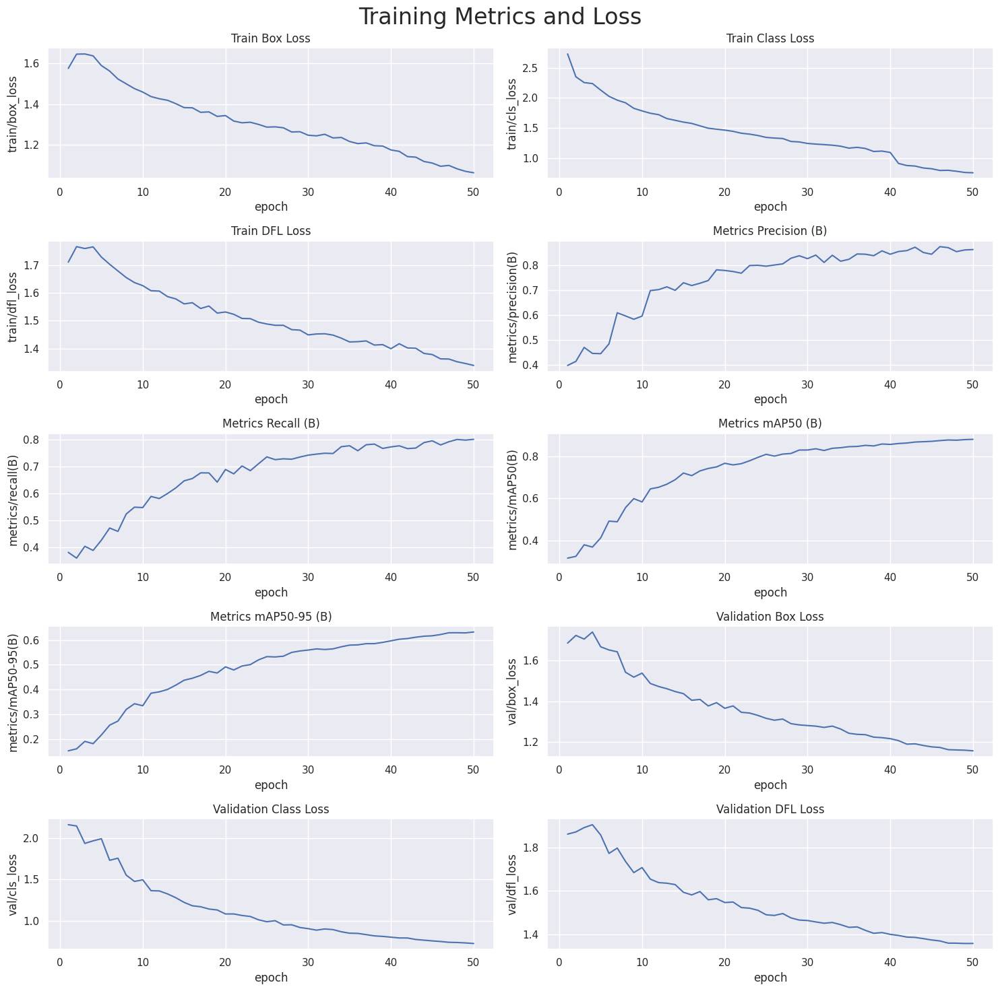

In [16]:
results.columns = results.columns.str.strip()
# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=results, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=results, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=results, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=results, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=results, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=results, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=results, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=results, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=results, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=results, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

In [17]:
# Loading the best performing model
Valid_model = YOLO('/kaggle/working/runs/detect/train2/weights/best.pt')

# Evaluating the model on the testset
metrics = Valid_model.val(split = 'test')

Ultralytics 8.3.96 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /kaggle/working/dataset/test/labels.cache... 2873 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2873/2873 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 180/180 [00:22<00:00,  7.84it/s]


                   all       2873       4184      0.863      0.801      0.881      0.632
                   Bio        638        848       0.85       0.78      0.864      0.627
                   Rov        444        572      0.824      0.825      0.881      0.687
                 Trash       2267       2764      0.914        0.8      0.898      0.582
Speed: 0.3ms preprocess, 4.4ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/val


In [18]:
# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

precision(B):  0.8625288217074819
metrics/recall(B):  0.8014699554854373
metrics/mAP50(B):  0.8808475018262921
metrics/mAP50-95(B):  0.6318655170669221



image 1/1 /kaggle/working/dataset/test/images/obj0243_frame0000033_jpg.rf.a43a9ca6ab88de66a46beed7623bdc6a.jpg: 640x640 1 Trash, 10.2ms
Speed: 2.3ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


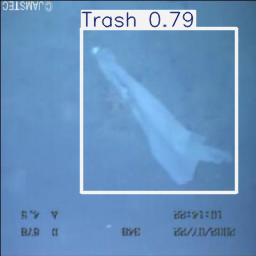


image 1/1 /kaggle/working/dataset/test/images/obj0236_frame0000040_jpg.rf.c4a4e62aa440812244dcd85e50c065cb.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.2ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


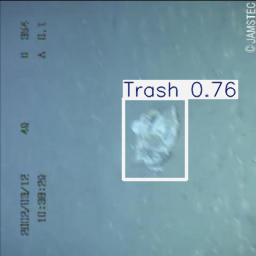


image 1/1 /kaggle/working/dataset/test/images/frame_01785_png_jpg.rf.4b343b77712fb87506e30e91c9265b9b.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


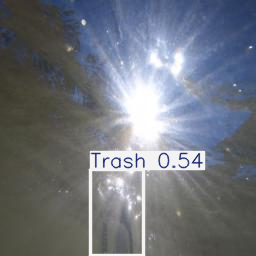


image 1/1 /kaggle/working/dataset/test/images/FishDataset632_png_jpg.rf.058b099550a182bb9a07e7cc9f626f85.jpg: 640x640 1 Bio, 1 Trash, 7.4ms
Speed: 2.2ms preprocess, 7.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


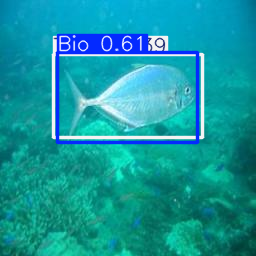


image 1/1 /kaggle/working/dataset/test/images/bio0017_frame0000150_jpg.rf.e2720dae14d48f4e888e00f514933094.jpg: 640x640 1 Bio, 7.2ms
Speed: 2.1ms preprocess, 7.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


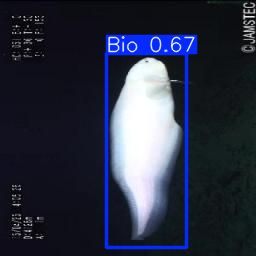


image 1/1 /kaggle/working/dataset/test/images/obj1505_frame0000140_jpg.rf.c87da01ae6da79f958646818d5444e33.jpg: 640x640 1 Trash, 7.3ms
Speed: 2.1ms preprocess, 7.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


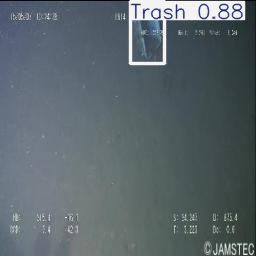


image 1/1 /kaggle/working/dataset/test/images/bio0017_frame0000269_jpg.rf.01f2bdba9b2bdb64acccbd80179ee9b5.jpg: 640x640 1 Bio, 7.1ms
Speed: 2.2ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


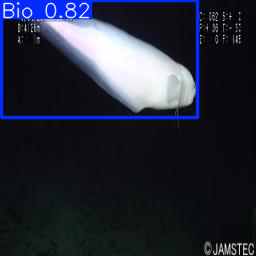


image 1/1 /kaggle/working/dataset/test/images/obj1297_frame0000313_jpg.rf.763daef1eb4d8f82446d7aeced45404b.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 2.4ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


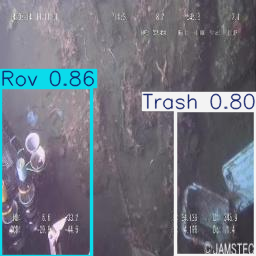


image 1/1 /kaggle/working/dataset/test/images/obj0713_frame0000015_jpg.rf.93b8487c547d775261cd6cb765c83e95.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.6ms preprocess, 7.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


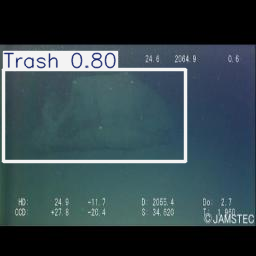


image 1/1 /kaggle/working/dataset/test/images/bio0000_frame0000091_jpg.rf.ef5fc3924dc916c2e492e9ccbd2b1a75.jpg: 640x640 2 Bios, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


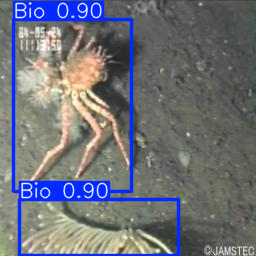


image 1/1 /kaggle/working/dataset/test/images/bio0002_frame0000140_jpg.rf.ada922af87f1916347966b996c3a40af.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


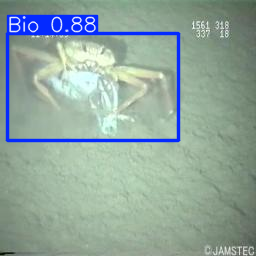


image 1/1 /kaggle/working/dataset/test/images/vid_000158_frame0000033_jpg.rf.75c4f19b13534c68c44a5c2dbfd06bd0.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


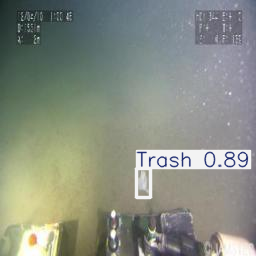


image 1/1 /kaggle/working/dataset/test/images/frame_01400_png_jpg.rf.b230822c77da5f43dcb7ad75131ab41e.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


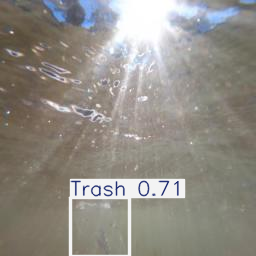


image 1/1 /kaggle/working/dataset/test/images/bio0013_frame0000171_jpg.rf.8cc775a159983db66e2dba49d2a624ad.jpg: 640x640 1 Bio, 1 Rov, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


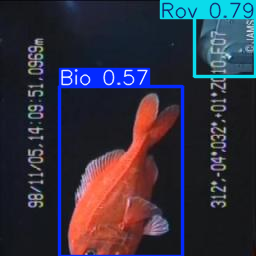


image 1/1 /kaggle/working/dataset/test/images/obj0226_frame0000056_jpg.rf.bf61683deae3c29f99bc29ac45775a50.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


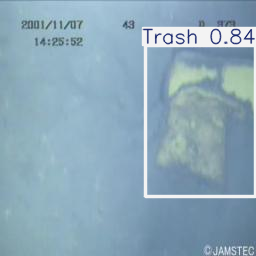


image 1/1 /kaggle/working/dataset/test/images/obj1502_frame0000132_jpg.rf.4cb2cb2c15a280a840ddb53c29c4b868.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


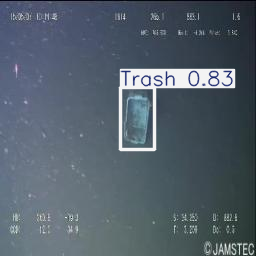


image 1/1 /kaggle/working/dataset/test/images/frame_00800_png_jpg.rf.a126deef1c13a337935323734448b0cd.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


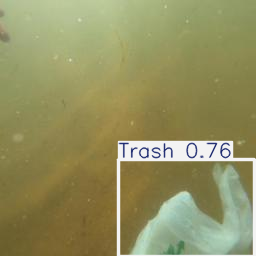


image 1/1 /kaggle/working/dataset/test/images/obj0002_frame0000030_jpg.rf.d3231e2d7acd75d4bcdec67f2806aea5.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.1ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


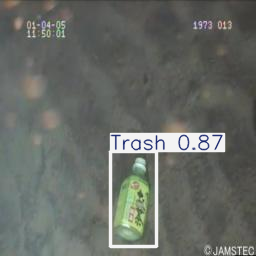


image 1/1 /kaggle/working/dataset/test/images/FishDataset485_png_jpg.rf.39e94594d9f23d88fae7d77ea55239e1.jpg: 640x640 2 Bios, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


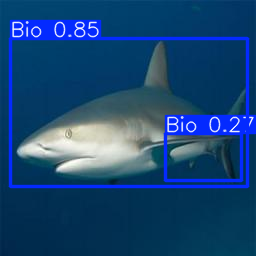


image 1/1 /kaggle/working/dataset/test/images/frame_00030_png_jpg.rf.3f7e7741c77209efd7227ddca47d05de.jpg: 640x640 11 Trashs, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


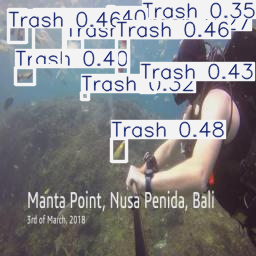


image 1/1 /kaggle/working/dataset/test/images/frame_00200_png_jpg.rf.127efbe3b31dc1e85227e674be818c54.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


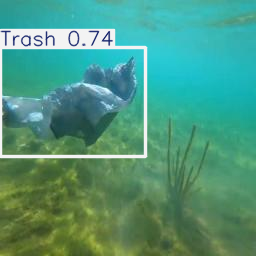


image 1/1 /kaggle/working/dataset/test/images/bio0004_frame0000232_jpg.rf.0160e557628a4b216f0b5a590593b714.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


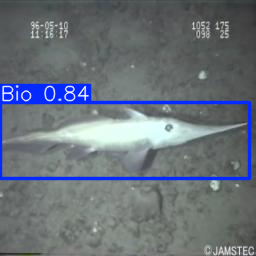


image 1/1 /kaggle/working/dataset/test/images/obj0307_frame0000009_jpg.rf.516b6b9b194cd1751546600e5c28a711.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 2.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


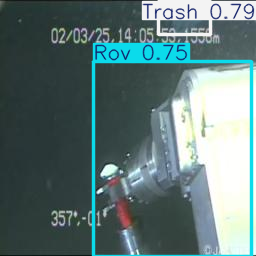


image 1/1 /kaggle/working/dataset/test/images/obj0331_frame0000014_jpg.rf.855199be30de618324c309891870b6fa.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


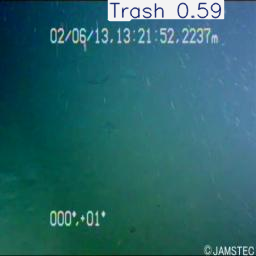


image 1/1 /kaggle/working/dataset/test/images/bio0017_frame0000138_jpg.rf.c02f1a892b76395525afe408e4e4ae56.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


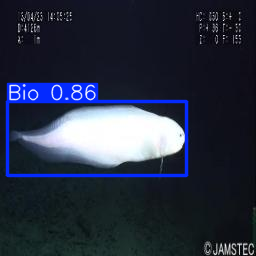


image 1/1 /kaggle/working/dataset/test/images/obj0002_frame0000003_jpg.rf.807cde23dc0643cfd4093f34b183f083.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


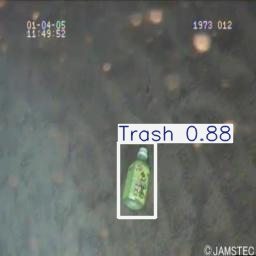


image 1/1 /kaggle/working/dataset/test/images/obj0317_frame0000028_jpg.rf.cc80445e8e9c4a4fcb0e6a38db4d79e8.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


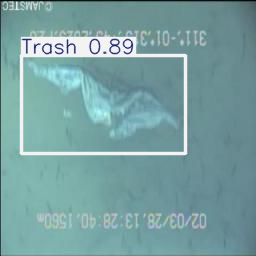


image 1/1 /kaggle/working/dataset/test/images/frame_00250_png_jpg.rf.7b80e7b3c2ed9c69409f2045242be681.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


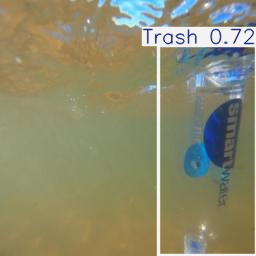


image 1/1 /kaggle/working/dataset/test/images/obj0309_frame0000039_jpg.rf.1400658980d090fd903fd95f477de366.jpg: 640x640 2 Trashs, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


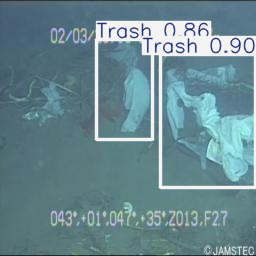


image 1/1 /kaggle/working/dataset/test/images/obj1505_frame0000220_jpg.rf.d070bc4fccfce8a8bee64e7b3155c3aa.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.4ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


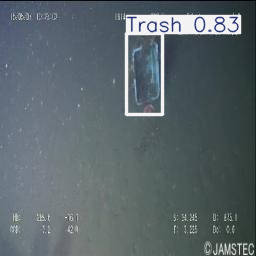


image 1/1 /kaggle/working/dataset/test/images/obj0317_frame0000048_jpg.rf.293ecf906e81abf4ca3b263545da89c6.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.1ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


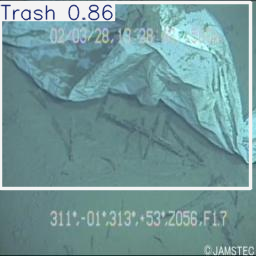


image 1/1 /kaggle/working/dataset/test/images/vid_000110_frame0000011_jpg.rf.d2c7de3112c0784dd1f8f7cdf5523a73.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


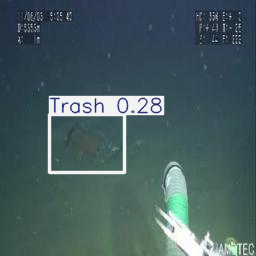


image 1/1 /kaggle/working/dataset/test/images/obj0000_frame0000003_jpg.rf.a1f99f48b8d2cf5470a40e991b8dc7ea.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 2.1ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


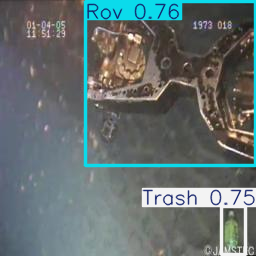


image 1/1 /kaggle/working/dataset/test/images/obj1658_frame0000276_jpg.rf.c897dced819bc3506bd89a41793bb044.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


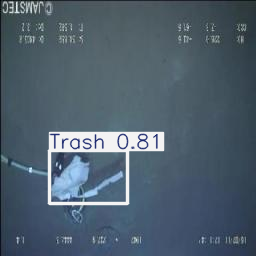


image 1/1 /kaggle/working/dataset/test/images/obj1281_frame0000024_jpg.rf.37515e1f02b6b0d3f255219fc7226956.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


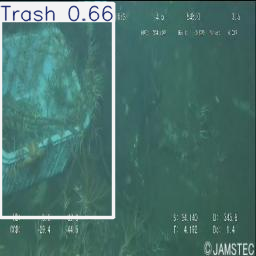


image 1/1 /kaggle/working/dataset/test/images/vid_000539_frame0000074_jpg.rf.7a006e47047fd523b408ec2fd87b6b14.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


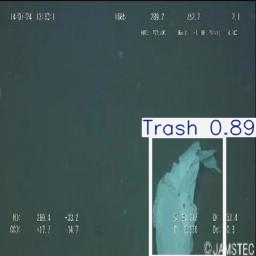


image 1/1 /kaggle/working/dataset/test/images/obj0317_frame0000044_jpg.rf.bc51f9b061172f96dd74b482cb5e2644.jpg: 640x640 1 Trash, 7.7ms
Speed: 1.9ms preprocess, 7.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


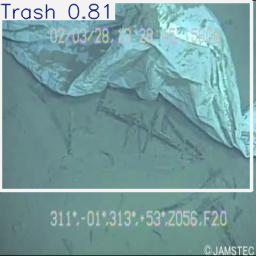


image 1/1 /kaggle/working/dataset/test/images/frame_01000_png_jpg.rf.032cc3b84b067a2cdb7d51db5db8ee0b.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


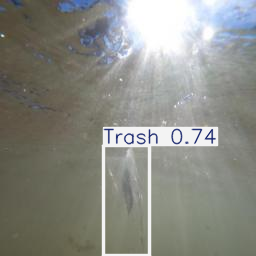


image 1/1 /kaggle/working/dataset/test/images/obj1502_frame0000242_jpg.rf.a3108c966c1a3b69522ba2551bbf7efd.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.4ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


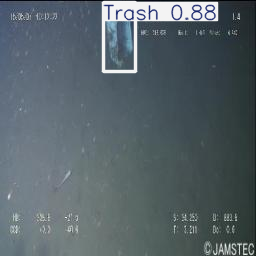


image 1/1 /kaggle/working/dataset/test/images/frame_01400_png_jpg.rf.8e1c782d964222dd4eec63d9d9924236.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


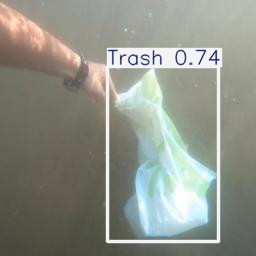


image 1/1 /kaggle/working/dataset/test/images/obj1617_frame0000051_jpg.rf.7646185f8eeedc6a3599981872128d38.jpg: 640x640 2 Rovs, 1 Trash, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


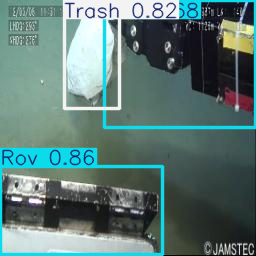


image 1/1 /kaggle/working/dataset/test/images/obj0348_frame0000105_jpg.rf.0f48d677f7f3e5a8529ba106ea5eb365.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


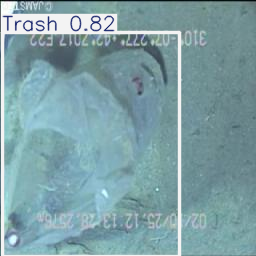


image 1/1 /kaggle/working/dataset/test/images/frame_00950_png_jpg.rf.c2524300229e43cb852dd355f69ad68a.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


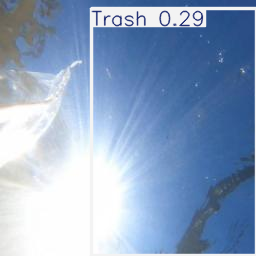


image 1/1 /kaggle/working/dataset/test/images/obj1505_frame0000108_jpg.rf.631aa8ed4fa0aa0c00383afe3e3a61b2.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


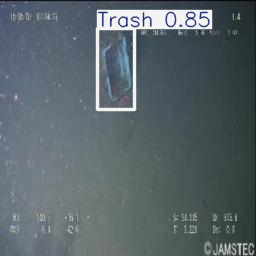


image 1/1 /kaggle/working/dataset/test/images/obj1658_frame0001122_jpg.rf.3d974c0586429e76b48c8386a0b6693f.jpg: 640x640 2 Rovs, 1 Trash, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


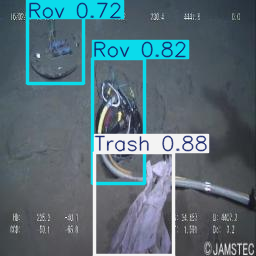


image 1/1 /kaggle/working/dataset/test/images/obj1626_frame0000080_jpg.rf.547591deafeab46fe25d5a5e80090a0c.jpg: 640x640 1 Rov, 1 Trash, 7.7ms
Speed: 2.5ms preprocess, 7.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


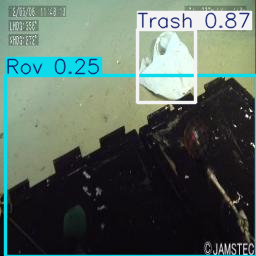


image 1/1 /kaggle/working/dataset/test/images/FishDataset565_png_jpg.rf.31ae2a689a8d92fbc492c7ceca327e0e.jpg: 640x640 2 Bios, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


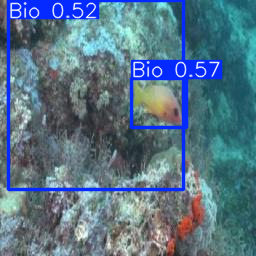


image 1/1 /kaggle/working/dataset/test/images/obj1003_frame0000029_jpg.rf.cc04b23793cb5ea625bdc70c19b5b76c.jpg: 640x640 2 Trashs, 7.1ms
Speed: 2.4ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


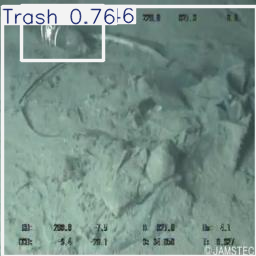


image 1/1 /kaggle/working/dataset/test/images/obj1502_frame0000317_jpg.rf.a2aee7867b0eb4d9036c2b02a2c58c85.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


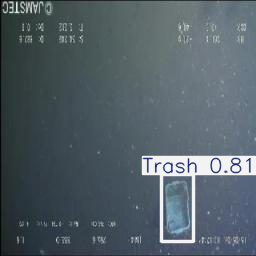


image 1/1 /kaggle/working/dataset/test/images/obj0314_frame0000037_jpg.rf.e324d228f86c6e27f30bd56eddea8d8d.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


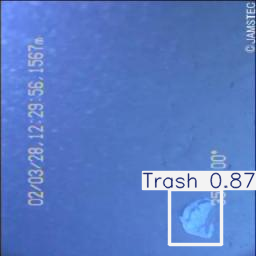


image 1/1 /kaggle/working/dataset/test/images/frame_00725_png_jpg.rf.7ac9446fd40580dfe5b96329f90776b6.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


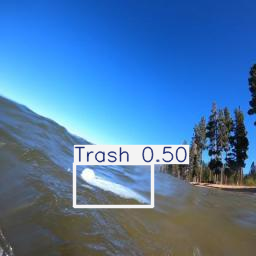


image 1/1 /kaggle/working/dataset/test/images/bio0002_frame0000176_jpg.rf.500d2f7c93cb9103a77e3445cc9bc435.jpg: 640x640 1 Bio, 7.4ms
Speed: 1.9ms preprocess, 7.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


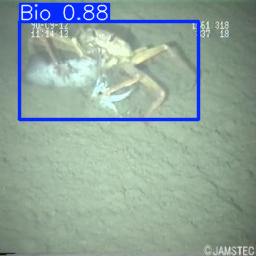


image 1/1 /kaggle/working/dataset/test/images/obj0241_frame0000037_jpg.rf.e48de925074246530591e7959e6344ba.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


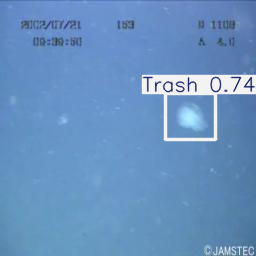


image 1/1 /kaggle/working/dataset/test/images/obj0708_frame0000064_jpg.rf.7f2d9411d88e648ab96ae89f0acd6c86.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


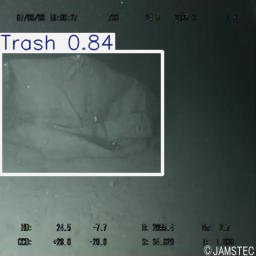


image 1/1 /kaggle/working/dataset/test/images/bio0016_frame0000343_jpg.rf.848da408c2fc8cdf4fa90a5c1b5b3310.jpg: 640x640 2 Bios, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


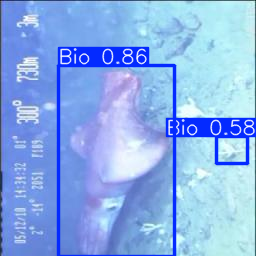


image 1/1 /kaggle/working/dataset/test/images/obj0319_frame0000054_jpg.rf.d326ba89dc33d9c63d4a2c6258316b9e.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


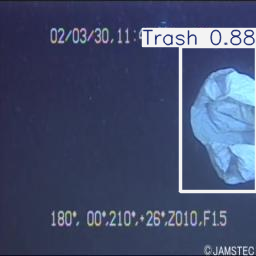


image 1/1 /kaggle/working/dataset/test/images/obj0236_frame0000067_jpg.rf.c72d657479acb93c481b9a62bf18c6bd.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


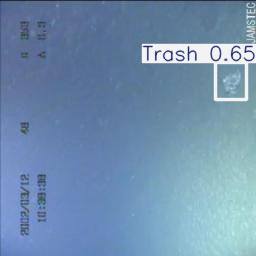


image 1/1 /kaggle/working/dataset/test/images/obj1654_frame0000321_jpg.rf.5f05adbd836af211b6311ff81fbd8c82.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 2.2ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


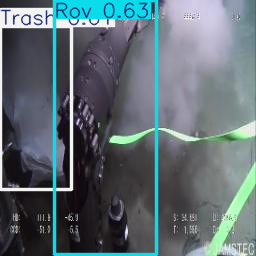


image 1/1 /kaggle/working/dataset/test/images/obj0236_frame0000032_jpg.rf.ef594f3d536eee9085b63f4c26ae679b.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


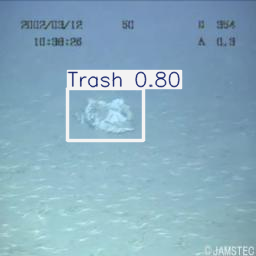


image 1/1 /kaggle/working/dataset/test/images/obj0871_frame0000100_jpg.rf.895ed6613b81433693771a11a0c96eca.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


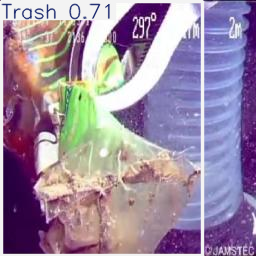


image 1/1 /kaggle/working/dataset/test/images/bio0003_frame0000068_jpg.rf.f884e147950fc488ad22610e790060a4.jpg: 640x640 1 Bio, 7.2ms
Speed: 2.4ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


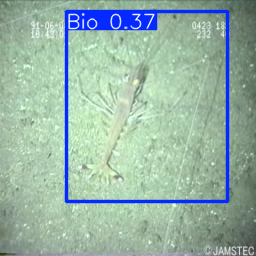


image 1/1 /kaggle/working/dataset/test/images/frame_00025_png_jpg.rf.06eb11947f689b0aa30ad0ed08a59052.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


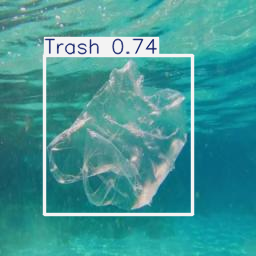


image 1/1 /kaggle/working/dataset/test/images/frame_00200_png_jpg.rf.aed10f37eb6bbe268a4a91ecf747f7f3.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.5ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


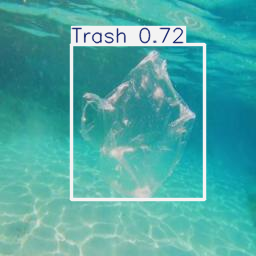


image 1/1 /kaggle/working/dataset/test/images/obj0707_frame0000026_jpg.rf.1a13419f0dedee2e93163696f4dacf72.jpg: 640x640 1 Bio, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


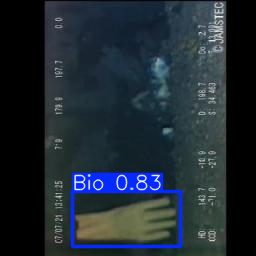


image 1/1 /kaggle/working/dataset/test/images/frame_00275_png_jpg.rf.1e63a9fbc55ae1e7e5f471e7a861d2dd.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


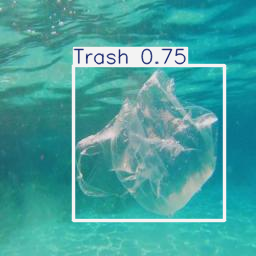


image 1/1 /kaggle/working/dataset/test/images/bio0012_frame0000455_jpg.rf.daab4f5e989880185fae522bdd08bf16.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


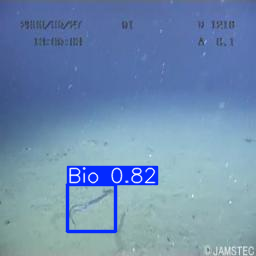


image 1/1 /kaggle/working/dataset/test/images/bio0002_frame0000654_jpg.rf.cf960fbd01151777b94265ff41b8096f.jpg: 640x640 2 Bios, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


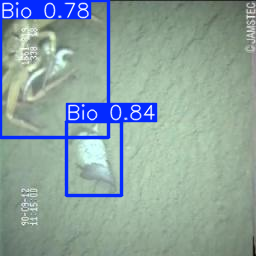


image 1/1 /kaggle/working/dataset/test/images/frame_00140_png_jpg.rf.d23cf0ce7fdaa5240fbe0f6915ee8f17.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


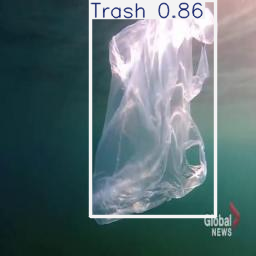


image 1/1 /kaggle/working/dataset/test/images/obj0301_frame0000005_jpg.rf.3e580125045c0a2079b292311756d17d.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


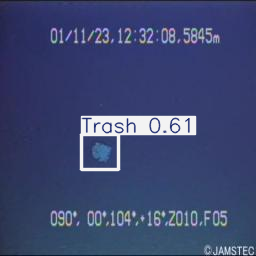


image 1/1 /kaggle/working/dataset/test/images/obj0309_frame0000098_jpg.rf.68b387a543b7b3b986361e08118a3ee4.jpg: 640x640 3 Trashs, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


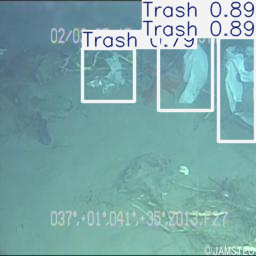


image 1/1 /kaggle/working/dataset/test/images/vid_000090_frame0000084_jpg.rf.ed7b8ae1082f20b659c8f467f1435b63.jpg: 640x640 3 Trashs, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


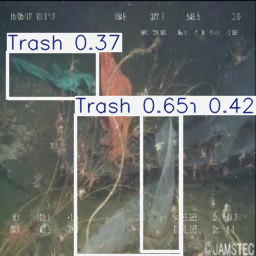


image 1/1 /kaggle/working/dataset/test/images/FishDataset431_png_jpg.rf.8c619758b9d400b1f16f7c322967cba1.jpg: 640x640 1 Bio, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


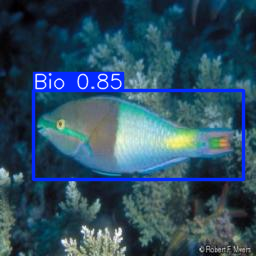


image 1/1 /kaggle/working/dataset/test/images/bio0017_frame0000187_jpg.rf.181b9017f6caec3f2115334400cf7671.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


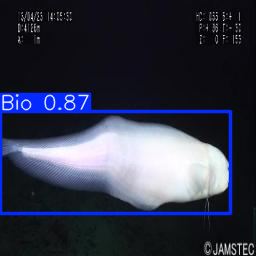


image 1/1 /kaggle/working/dataset/test/images/vid_000316_frame0000034_jpg.rf.6d062cbbc75439e66d46c6858aba6582.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


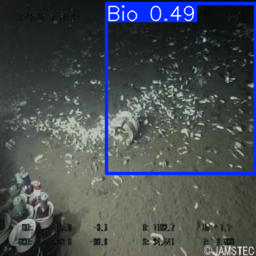


image 1/1 /kaggle/working/dataset/test/images/vid_000118_frame0000031_jpg.rf.61515a8b6ed2be92081782d7696db3f8.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


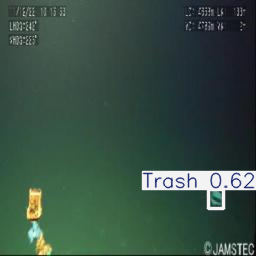


image 1/1 /kaggle/working/dataset/test/images/vid_000332_frame0000098_jpg.rf.18aa13f5f75edf4b19845ce39de58df3.jpg: 640x640 (no detections), 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


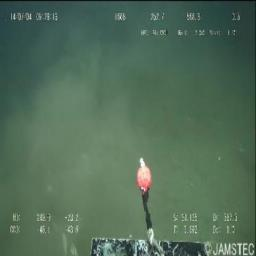


image 1/1 /kaggle/working/dataset/test/images/vid_000255_frame0000030_jpg.rf.ec810ce12b99acfa5a6e32b66a8ce373.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


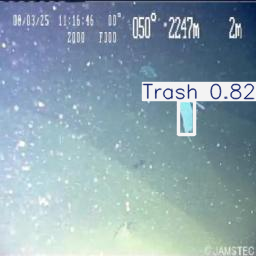


image 1/1 /kaggle/working/dataset/test/images/obj0313_frame0000047_jpg.rf.d11c562ce0132f4c020922c8320cec07.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


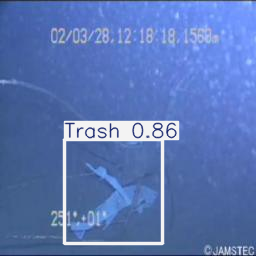


image 1/1 /kaggle/working/dataset/test/images/obj1617_frame0000230_jpg.rf.1ca19ce04d33be7714c495c4a9526a77.jpg: 640x640 2 Rovs, 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


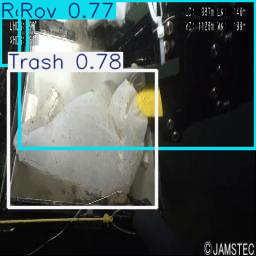


image 1/1 /kaggle/working/dataset/test/images/frame_00300_png_jpg.rf.0d325f6235ba2da932bfced2ae5d3d8b.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


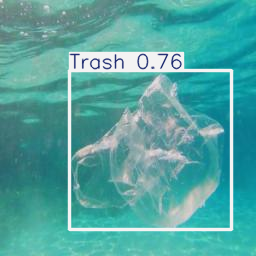


image 1/1 /kaggle/working/dataset/test/images/obj1648_frame0000121_jpg.rf.3b4bb041c2f50d309439cf3f83e41008.jpg: 640x640 2 Rovs, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


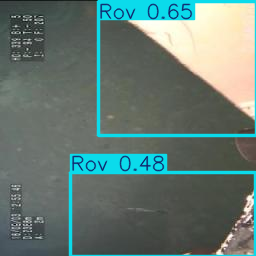


image 1/1 /kaggle/working/dataset/test/images/obj0317_frame0000034_jpg.rf.c88218b89e63162f61b51576fe714162.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


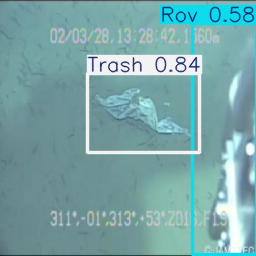


image 1/1 /kaggle/working/dataset/test/images/obj0304_frame0000025_jpg.rf.f0f3dd1209112b720ade774bcdfb719f.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


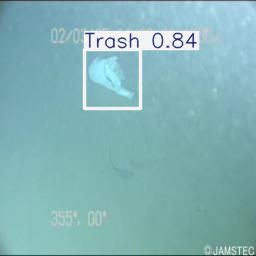


image 1/1 /kaggle/working/dataset/test/images/bio0000_frame0000135_jpg.rf.94d049f748879f521dd09d1cab73f258.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


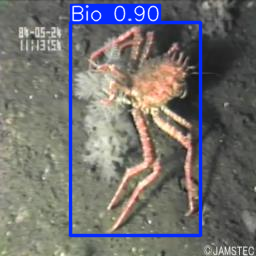


image 1/1 /kaggle/working/dataset/test/images/obj0348_frame0000179_jpg.rf.6d864a33ad24a6c3947a42d7eb8212fb.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


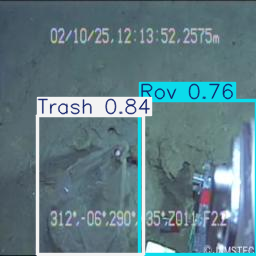


image 1/1 /kaggle/working/dataset/test/images/obj1505_frame0000327_jpg.rf.8e703905eace1f997f5aeeb28974b845.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


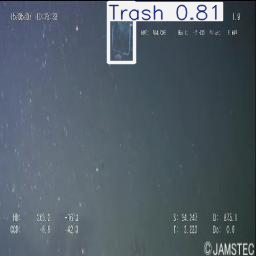


image 1/1 /kaggle/working/dataset/test/images/frame_01175_png_jpg.rf.84bf0f38d6c4378624c7261be8ad2140.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


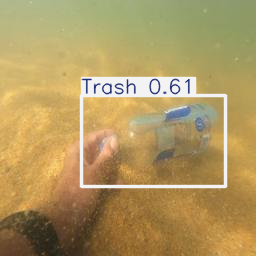


image 1/1 /kaggle/working/dataset/test/images/vid_000532_frame0000170_jpg.rf.9efea56e86aecfba4cc29c17e149913e.jpg: 640x640 1 Trash, 7.2ms
Speed: 2.3ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


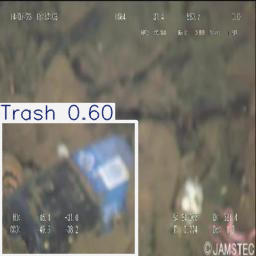


image 1/1 /kaggle/working/dataset/test/images/obj0348_frame0000166_jpg.rf.eaeb6c99a5f07a5c12d3cc1e9f848764.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


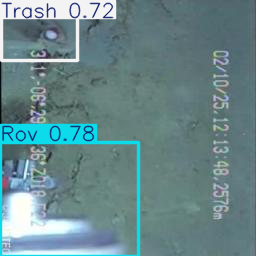


image 1/1 /kaggle/working/dataset/test/images/bio0000_frame0000222_jpg.rf.0a4c605dae1b588827a6cc4506011574.jpg: 640x640 1 Bio, 7.2ms
Speed: 1.9ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


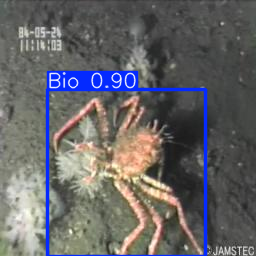


image 1/1 /kaggle/working/dataset/test/images/frame_01305_png_jpg.rf.a5ca3481038cb20b207ea92931a55d60.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


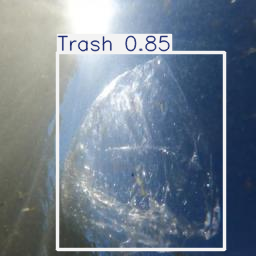


image 1/1 /kaggle/working/dataset/test/images/vid_000162_frame0000024_jpg.rf.90d50f3facf21e1ecb535e558bdb1f33.jpg: 640x640 2 Trashs, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


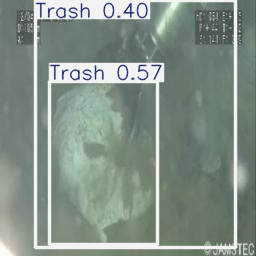


image 1/1 /kaggle/working/dataset/test/images/frame_00475_png_jpg.rf.bc50c8030bbe6450cc4cf97787409ce0.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


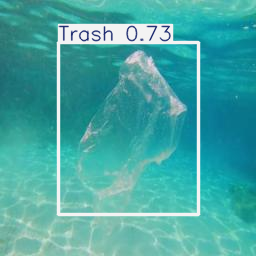


image 1/1 /kaggle/working/dataset/test/images/frame_01500_png_jpg.rf.a1e7562906c400417a13abdb5c49c273.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.4ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


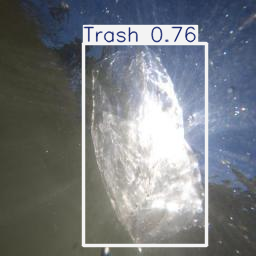


image 1/1 /kaggle/working/dataset/test/images/obj1023_frame0000012_jpg.rf.c461223d937c1dd24993968eaba6eaee.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


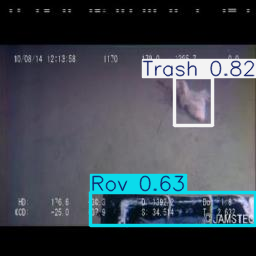


image 1/1 /kaggle/working/dataset/test/images/vid_000162_frame0000045_jpg.rf.ee9daa1d9eed0a4f01673ab8b23dae3f.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


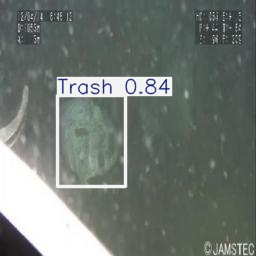


image 1/1 /kaggle/working/dataset/test/images/obj0760_frame0000167_jpg.rf.85d55db4c0b5cf6fc8c9b92bdebad106.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


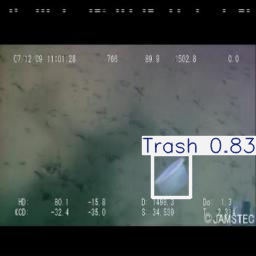


image 1/1 /kaggle/working/dataset/test/images/bio0010_frame0000157_jpg.rf.e294bf8f507cffeb6b3ceae6f89520f5.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


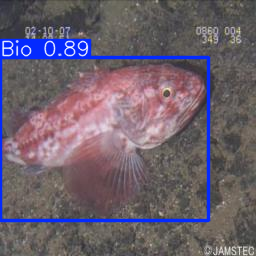


image 1/1 /kaggle/working/dataset/test/images/bio0000_frame0000161_jpg.rf.031ea8f82bc68429f7539507fc271943.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


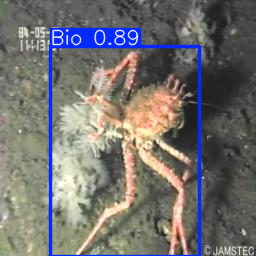


image 1/1 /kaggle/working/dataset/test/images/obj1003_frame0000056_jpg.rf.d918bc51ed939c12af0385b5977fb975.jpg: 640x640 2 Trashs, 7.1ms
Speed: 2.4ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


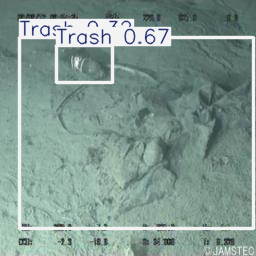


image 1/1 /kaggle/working/dataset/test/images/obj1280_frame0000189_jpg.rf.f45bdd6cadb7945975a4899ae5194f0a.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


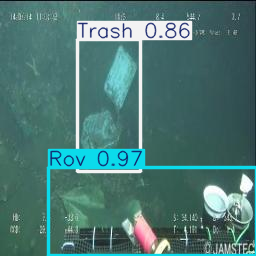


image 1/1 /kaggle/working/dataset/test/images/obj1616_frame0000043_jpg.rf.17d0aa386bf0e7affd95ab5157a5f80a.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


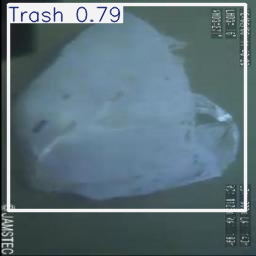


image 1/1 /kaggle/working/dataset/test/images/obj0762_frame0000097_jpg.rf.bf6ed7ff890fe8fb7b09a27ea033cc02.jpg: 640x640 1 Trash, 7.2ms
Speed: 1.8ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


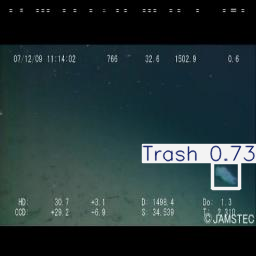


image 1/1 /kaggle/working/dataset/test/images/obj0334_frame0000024_jpg.rf.176753aacd6e9285f437b0fd92e663ec.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


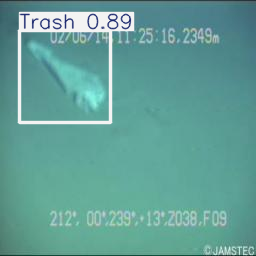


image 1/1 /kaggle/working/dataset/test/images/bio0016_frame0000243_jpg.rf.533c6ee1ea2a114f1ac71a88494aada8.jpg: 640x640 1 Bio, 7.2ms
Speed: 2.0ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


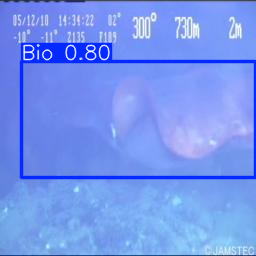


image 1/1 /kaggle/working/dataset/test/images/obj1656_frame0000010_jpg.rf.4022d8fdea3e91ec487a137bd7668cbe.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 2.1ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


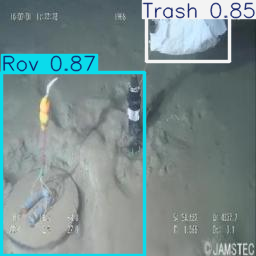


image 1/1 /kaggle/working/dataset/test/images/vid_000083_frame0000002_jpg.rf.f0476b83e3c8ccba07c5a8d485b87820.jpg: 640x640 1 Trash, 7.2ms
Speed: 2.5ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


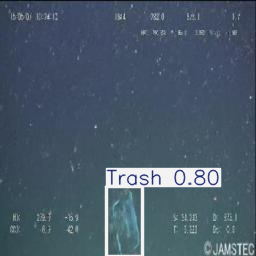


image 1/1 /kaggle/working/dataset/test/images/obj1602_frame0000026_jpg.rf.057e647233dd4b4b699d5cb75484f420.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.5ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


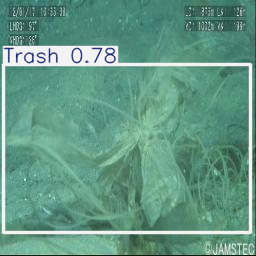


image 1/1 /kaggle/working/dataset/test/images/obj1505_frame0000040_jpg.rf.4eccb2f3848f295fbf2529d5b8f83d36.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.6ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


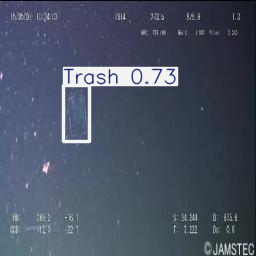


image 1/1 /kaggle/working/dataset/test/images/bio0011_frame0000245_jpg.rf.62318914b5439dfb6e05dfefef4ad199.jpg: 640x640 1 Bio, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


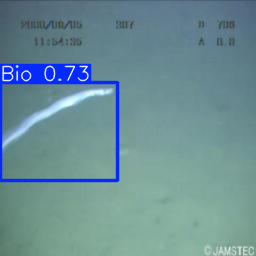


image 1/1 /kaggle/working/dataset/test/images/vid_000255_frame0000052_jpg.rf.1931634cb19aa78377f274221b10c699.jpg: 640x640 1 Trash, 7.2ms
Speed: 2.2ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


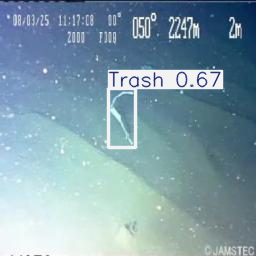


image 1/1 /kaggle/working/dataset/test/images/bio0015_frame0000469_jpg.rf.27c1d3b68e27406f5b7c01e58855d23b.jpg: 640x640 1 Bio, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


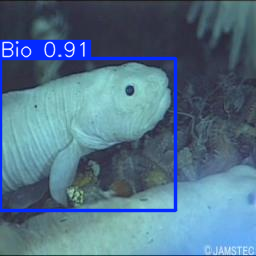


image 1/1 /kaggle/working/dataset/test/images/obj1648_frame0000437_jpg.rf.368efcbb6d3292bb7f3db689ea9f83ba.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


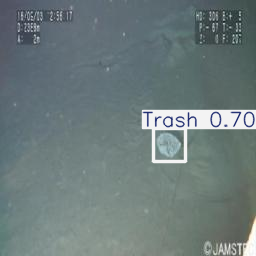


image 1/1 /kaggle/working/dataset/test/images/obj0300_frame0000027_jpg.rf.251e1cbe339392ebf4c84b5eb29b23dc.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


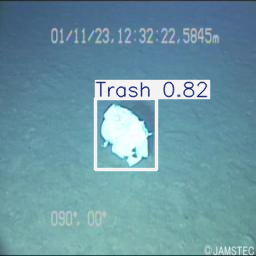


image 1/1 /kaggle/working/dataset/test/images/obj0243_frame0000017_jpg.rf.55f05d9f70548f425697b277c263a186.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


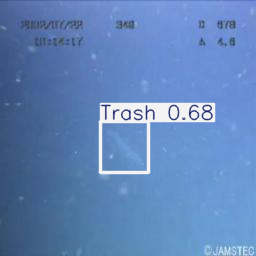


image 1/1 /kaggle/working/dataset/test/images/obj0750_frame0000041_jpg.rf.7627a9af6bbcf35567310b6fd34ddf69.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


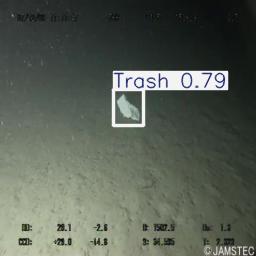


image 1/1 /kaggle/working/dataset/test/images/bio0002_frame0000678_jpg.rf.ce88a9f253373ab96cae1239d9b3c0c0.jpg: 640x640 2 Bios, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


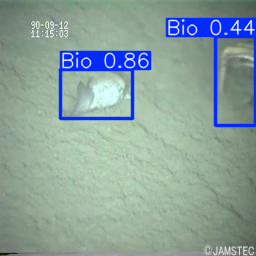


image 1/1 /kaggle/working/dataset/test/images/obj0226_frame0000022_jpg.rf.d5415cb7da8fd356d9dad8158de549a6.jpg: 640x640 1 Trash, 7.2ms
Speed: 2.5ms preprocess, 7.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


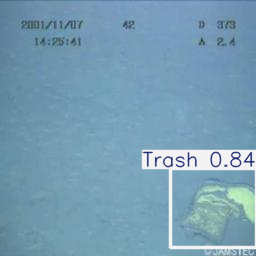


image 1/1 /kaggle/working/dataset/test/images/obj0340_frame0000020_jpg.rf.59a43130fc68a38ff1f3199a21eb659f.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


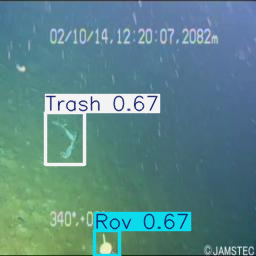


image 1/1 /kaggle/working/dataset/test/images/bio0010_frame0000068_jpg.rf.21d69bbde32b96ed70a99b1c852424bd.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


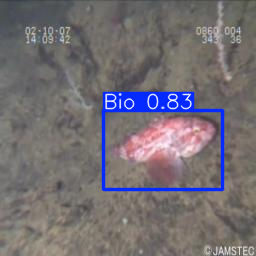

In [20]:
import os
images = os.listdir("/kaggle/working/dataset/test/images")
for i in range(120):
    image = os.path.join("/kaggle/working/dataset/test/images", images[i])
    result_predict = Valid_model.predict(source = image, imgsz=(640), iou=0.4)

    # show results
    plot = result_predict[0].plot()
    plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
    display(Image.fromarray(plot))